In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.interpolate import interp1d
from rdkit import Chem
from rdkit.Chem import AllChem

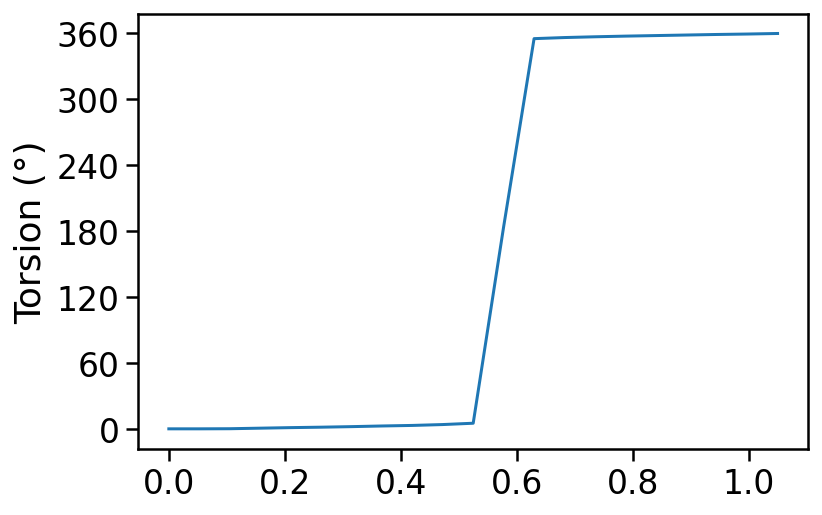

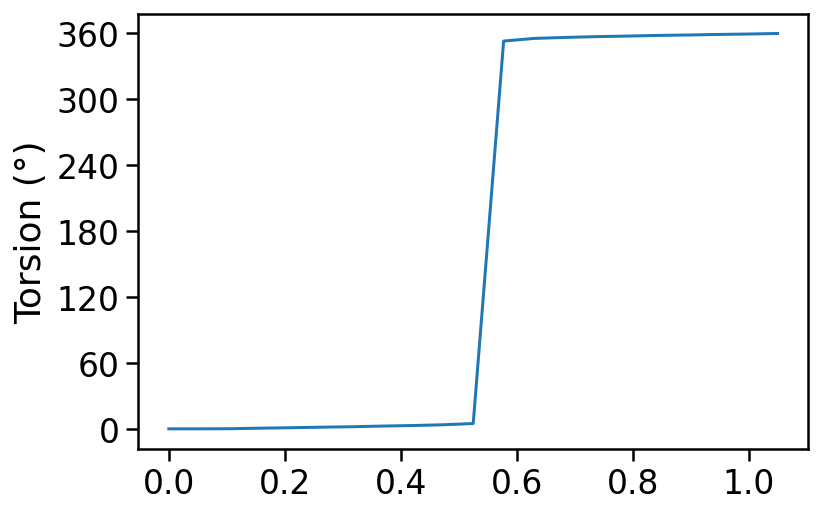

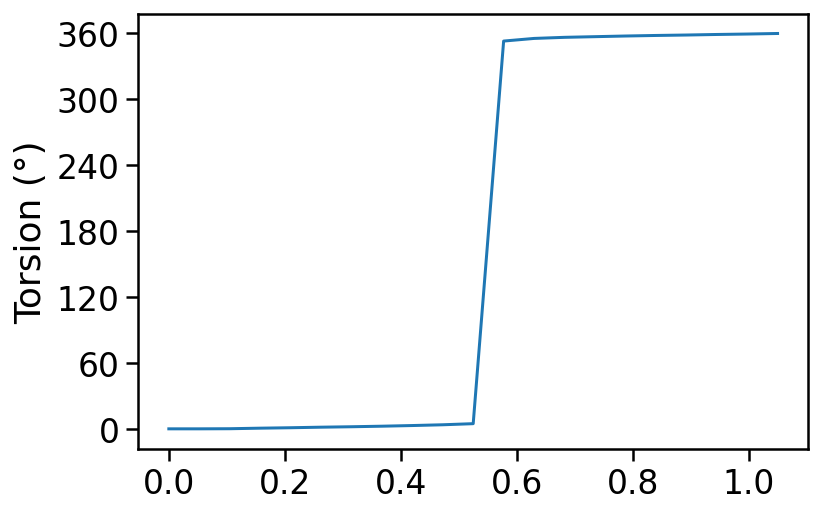

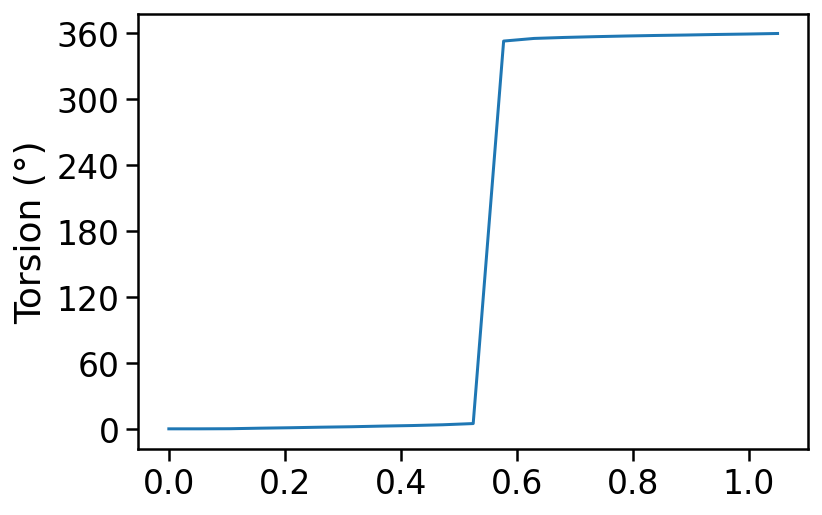

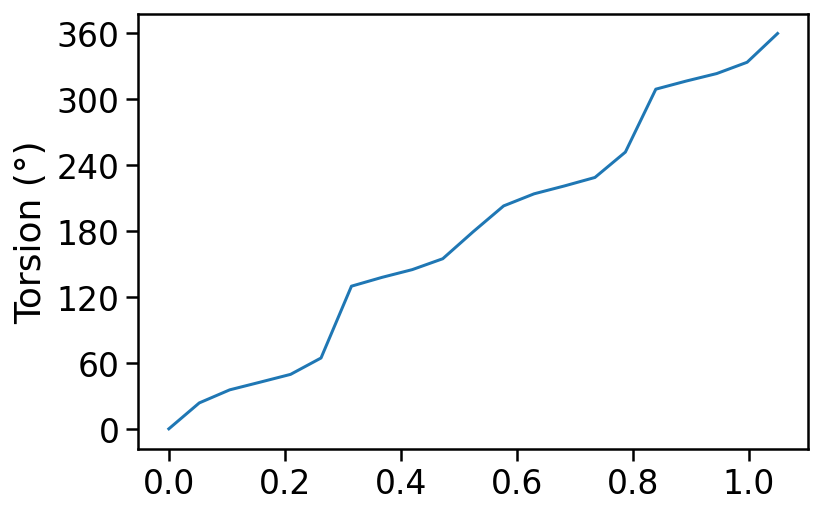

...

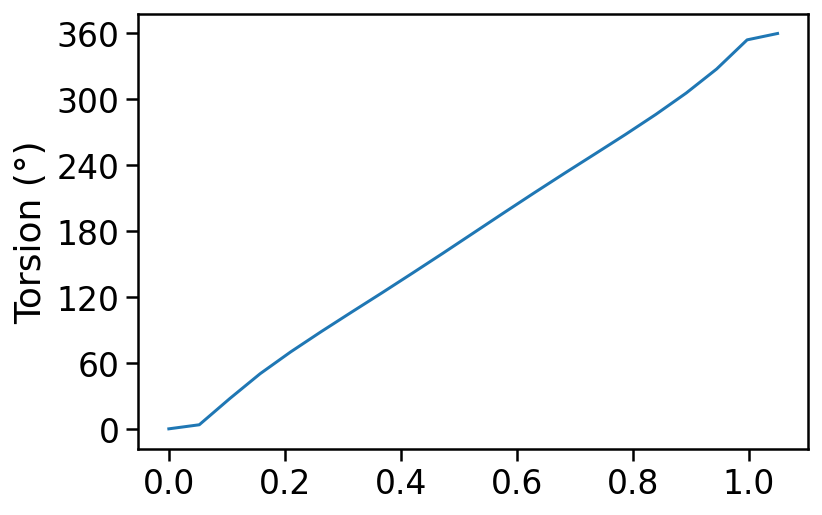

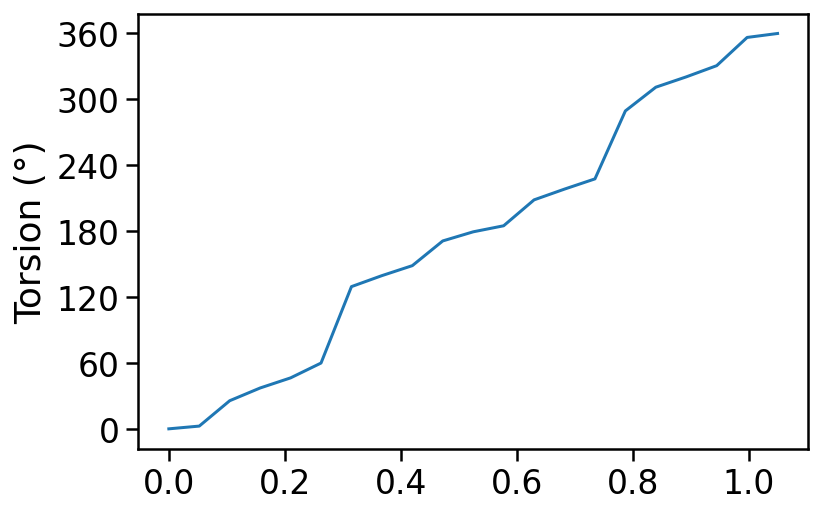

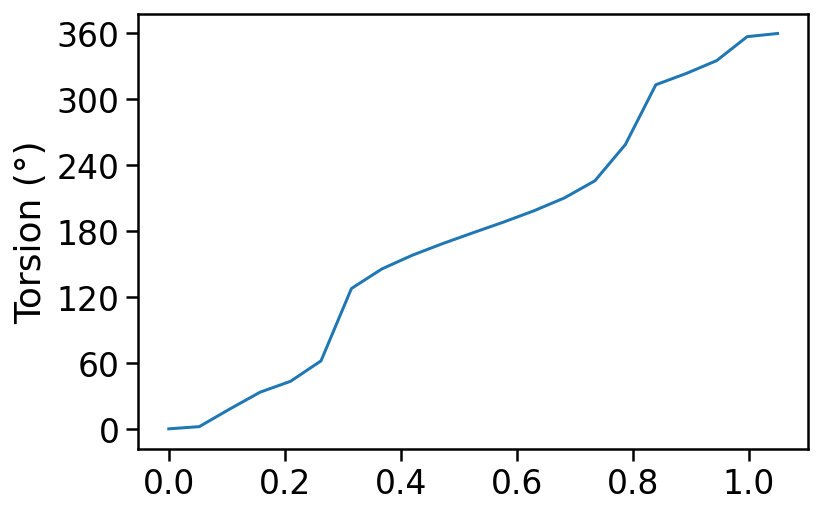

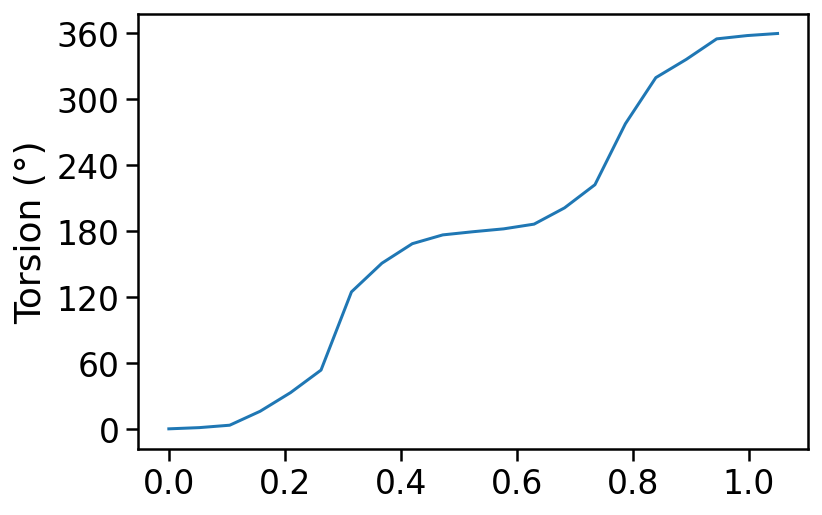

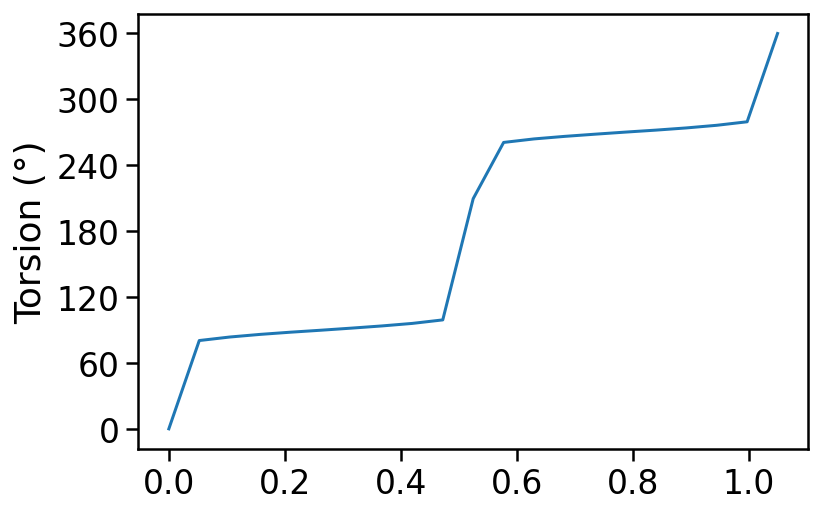

In [13]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_context("notebook", font_scale=1.5)

patterns = []
pattern_maps = []
angle_data = []
with open("qtdg.txt") as data:
    for line in data:
        # skip comment lines (e.g. at the top)
        if "//" in line:
            continue
        
        smarts = line.split()[0]
        angles = np.array(line.split()[1:], dtype=np.float32)
        
        x = np.linspace(0.0, 1.05, 21)
        y = np.append(angles, 360.0)
    
        sns.lineplot(x=x, y=y)
        plt.ylabel("Torsion (°)")
        plt.yticks(np.linspace(0, 360, 7))
        plt.show()

In [ ]:
# read in the qtdg data
# [smarts] 0 -> 360 angles from 0.0 to 0.95 probability
patterns = []
pattern_maps = []
angle_data = []
with open("qtdg.txt") as data:
    for line in data:
        # skip comment lines (e.g. at the top)
        if "//" in line:
            continue
        
        smarts = line.split()[0]
        angles = np.array(line.split()[1:], dtype=np.float32)
        
        x = np.linspace(0.0, 1.05, 21)
        y = np.append(angles, 360.0)
    
        plt.plot(x, y)
        
        # convert the text into an RDKit SMARTS
        qmol = Chem.MolFromSmarts(smarts)
        if qmol is None:
            print("Conversion error,", smarts)
            continue
        
        # From the RDKit Cookbook 
        # https://www.rdkit.org/docs/GettingStartedInPython.html#atom-map-indices-in-smarts
        ind_map = {}
        for atom in qmol.GetAtoms():
            map_num = atom.GetAtomMapNum()
            if map_num:
                ind_map[map_num-1] = atom.GetIdx()
        map_list = [ind_map[x] for x in sorted(ind_map)]
        
        # save the patterns, maps, and angle data
        patterns.append(qmol)
        pattern_maps.append(map_list)
        angle_data.append(angles)

In [ ]:
# Now check torsions for matching patterns and update accordingly
m = Chem.MolFromSmiles('O=C1COCCN1c2ccc(cc2)N3C[C@@H](OC3=O)CNC(=O)c4ccc(s4)Cl')
mol = Chem.AddHs(m)
AllChem.EmbedMolecule(mol)

for i in range(len(patterns)):
    qmol = patterns[i]
    map_list = pattern_maps[i]
    angles = angle_data[i]
    
    matches = mol.GetSubstructMatches( qmol )
    if len(matches) == 0:
        continue
    
    # generate the interpolation
    x = np.linspace(0.0, 1.05, 21)
    y = np.append(angles, 360.0)
    
    torsion_distribution = interp1d(x, y)
    for match in matches:
        # random angle from interpolation converted to radians
        # will map from 0.. 2*pi
        angle = torsion_distribution(np.random.random()) * np.pi / 180.0
        print("Match: ", Chem.MolToSmiles(patterns[i]), angle)
        
        index = [match[x] for x in map_list]
        # set the torsion angle
        Chem.rdMolTransforms.SetDihedralRad(mol.GetConformer(0), *index, angle)